In [49]:
import os
import sys
import scipy.io
import scipy.misc
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from PIL import Image
import numpy as np
import tensorflow as tf
import pprint
%matplotlib inline
from keras.applications.vgg19 import VGG19
from keras.applications.vgg16 import VGG16

In [50]:
tf.random.set_seed(272) # DO NOT CHANGE THIS VALUE
pp = pprint.PrettyPrinter(indent=4)
img_size = 400
vgg = tf.keras.applications.VGG19(include_top=False,
                                  input_shape=(img_size, img_size, 3),
                                  weights='imagenet')

vgg.trainable = False
pp.pprint(vgg)

In [51]:
tf.random.set_seed(272) # DO NOT CHANGE THIS VALUE
pp = pprint.PrettyPrinter(indent=4)
img_size = 400
vgg1 = tf.keras.applications.VGG16(include_top=False,
                                  input_shape=(img_size, img_size, 3),
                                  weights='imagenet')

vgg1.trainable = False
pp.pprint(vgg1)

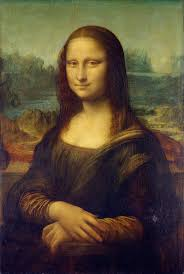

In [52]:
content_image = Image.open("/mona_lisa.jpg")
content_image

In [53]:
# UNQ_C1
# GRADED FUNCTION: compute_content_cost

def compute_content_cost(content_output, generated_output):
    """
    Computes the content cost

    Arguments:
    a_C -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing content of the image C
    a_G -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing content of the image G

    Returns:
    J_content -- scalar that you compute using equation 1 above.
    """
    a_C = content_output[-1]
    a_G = generated_output[-1]

    ### START CODE HERE

    # Retrieve dimensions from a_G (≈1 line)
    _, n_H, n_W, n_C = a_G.get_shape().as_list()


    # Reshape 'a_C' and 'a_G' (≈2 lines)
    # DO NOT reshape 'content_output' or 'generated_output'
    a_C_unrolled = tf.reshape(a_C, shape=[_, n_H * n_W, n_C])
    a_G_unrolled = tf.reshape(a_G, shape=[_, n_H * n_W, n_C])



    # compute the cost with tensorflow (≈1 line)
    J_content = (tf.reduce_sum(tf.math.square(tf.subtract(a_C_unrolled,a_G_unrolled))))/(4*n_H*n_W*n_C)

    ### END CODE HERE

    return J_content

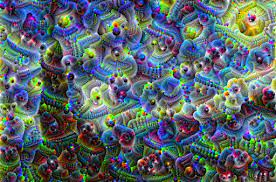

In [54]:
style= Image.open("/style3.jpg")
style

In [55]:
def gram_matrix(A):
    """
    Argument:
    A -- matrix of shape (n_C, n_H*n_W)

    Returns:
    GA -- Gram matrix of A, of shape (n_C, n_C)
    """
    ### START CODE HERE

    #(≈1 line)
    GA = tf.matmul(A,tf.transpose(A))

    ### END CODE HERE

    return GA

In [56]:
def compute_layer_style_cost(a_S, a_G):
    """
    Arguments:
    a_S -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image S
    a_G -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image G

    Returns:
    J_style_layer -- tensor representing a scalar value, style cost defined above by equation (2)
    """
    ### START CODE HERE

    # Retrieve dimensions from a_G (≈1 line)
    _, n_H, n_W, n_C = a_G.get_shape().as_list()
    print(a_G.get_shape().as_list())

    # Reshape the tensors from (1, n_H, n_W, n_C) to (n_C, n_H * n_W) (≈2 lines)
    a_S = tf.reshape(a_S, [n_H * n_W, n_C])
    a_G = tf.reshape(a_G, [n_H * n_W, n_C])

    # Transpose the tensors to (n_C, n_H * n_W)
    a_S = tf.transpose(a_S)
    a_G = tf.transpose(a_G)

    print(a_S.get_shape().as_list)

    # Computing gram_matrices for both images S and G (≈2 lines)
    GS = gram_matrix(a_S)
    GG = gram_matrix(a_G)

    # Computing the loss (≈1 line)
    J_style_layer = tf.reduce_sum(tf.square(GS - GG))
    print(J_style_layer)
    print(4.0 * (n_H*n_W*n_C)**2)
    return J_style_layer / (4.0 * (n_H * n_W * n_C) ** 2)

In [57]:
for layer in vgg.layers:
    print(layer.name)

input_5
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [58]:
vgg.get_layer('block5_conv4').output

<KerasTensor: shape=(None, 25, 25, 512) dtype=float32 (created by layer 'block5_conv4')>

In [59]:
STYLE_LAYERS = [
    ('block1_conv1', 0.2),
    ('block2_conv1', 0.2),
    ('block3_conv1', 0.2),
    ('block4_conv1', 0.2),
    ('block5_conv1', 0.2)]

In [60]:


def compute_style_cost(style_image_output, generated_image_output, STYLE_LAYERS=STYLE_LAYERS):
    """
    Computes the overall style cost from several chosen layers

    Arguments:
    style_image_output -- our tensorflow model
    generated_image_output --
    STYLE_LAYERS -- A python list containing:
                        - the names of the layers we would like to extract style from
                        - a coefficient for each of them

    Returns:
    J_style -- tensor representing a scalar value, style cost defined above by equation (2)
    """

    # initialize the overall style cost
    J_style = 0

    # Set a_S to be the hidden layer activation from the layer we have selected.
    # The last element of the array contains the content layer image, which must not be used.
    a_S = style_image_output[:-1]

    # Set a_G to be the output of the choosen hidden layers.
    # The last element of the list contains the content layer image which must not be used.
    a_G = generated_image_output[:-1]
    for i, weight in zip(range(len(a_S)), STYLE_LAYERS):
        # Compute style_cost for the current layer
        J_style_layer = compute_layer_style_cost(a_S[i], a_G[i])

        # Add weight * J_style_layer of this layer to overall style cost
        J_style += weight[1] * J_style_layer

    return J_style

In [61]:
@tf.function()
def total_cost(J_content, J_style, alpha = 10, beta = 40):
    """
    Computes the total cost function

    Arguments:
    J_content -- content cost coded above
    J_style -- style cost coded above
    alpha -- hyperparameter weighting the importance of the content cost
    beta -- hyperparameter weighting the importance of the style cost

    Returns:
    J -- total cost as defined by the formula above.
    """
    ### START CODE HERE

    #(≈1 line)
    J = alpha* J_content + beta * J_style

    ### START CODE HERE

    return J

(1, 400, 400, 3)


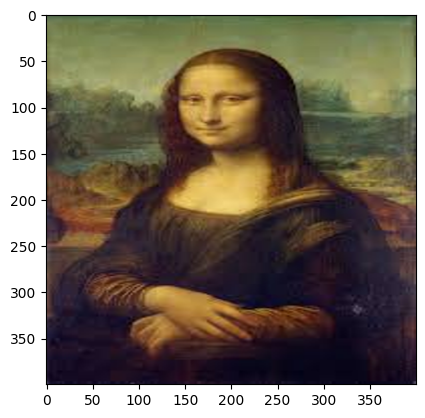

In [62]:
content_image = np.array(Image.open("/mona_lisa.jpg").resize((img_size, img_size)))
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))

print(content_image.shape)
imshow(content_image[0])
plt.show()

(1, 400, 400, 3)


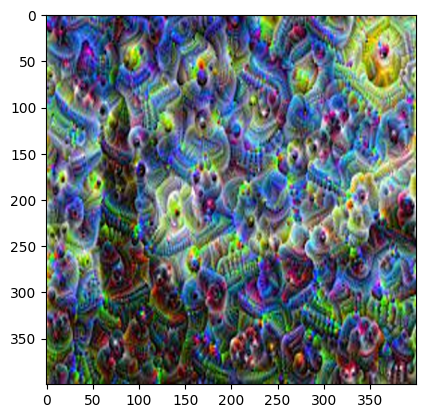

In [63]:
style_image =  np.array(Image.open("/style3.jpg").resize((img_size, img_size)))
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))

print(style_image.shape)
imshow(style_image[0])
plt.show()

(1, 400, 400, 3)


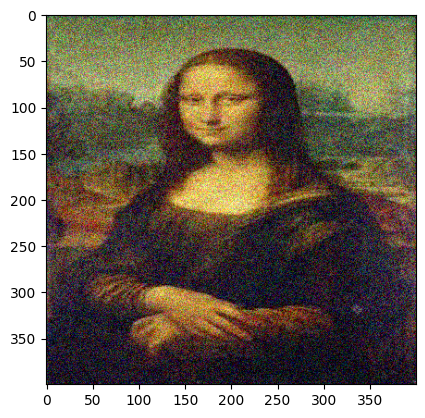

In [64]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), -0.25, 0.25)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)

print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

In [65]:
def get_layer_outputs(vgg, layer_names):
    """ Creates a vgg model that returns a list of intermediate output values."""
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

In [66]:
content_layer = [('block5_conv4', 1)]

vgg_model_outputs = get_layer_outputs(vgg, STYLE_LAYERS + content_layer)

In [67]:
content_target = vgg_model_outputs(content_image)  # Content encoder
style_targets = vgg_model_outputs(style_image)     # Style encoder

In [68]:
# Assign the content image to be the input of the VGG model.
# Set a_C to be the hidden layer activation from the layer we have selected
preprocessed_content =  tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

In [69]:
# Assign the input of the model to be the "style" image
preprocessed_style =  tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S = vgg_model_outputs(preprocessed_style)

In [70]:
def clip_0_1(image):
    """
    Truncate all the pixels in the tensor to be between 0 and 1

    Arguments:
    image -- Tensor
    J_style -- style cost coded above

    Returns:
    Tensor
    """
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

def tensor_to_image(tensor):
    """
    Converts the given tensor into a PIL image

    Arguments:
    tensor -- Tensor

    Returns:
    Image: A PIL image
    """
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

In [71]:
#train_step

optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

@tf.function()
def train_step(generated_image):
    with tf.GradientTape() as tape:
        # In this function you must use the precomputed encoded images a_S and a_C

        ### START CODE HERE

        # Compute a_G as the vgg_model_outputs for the current generated image
        #(1 line)
        a_G = vgg_model_outputs(generated_image)

        # Compute the style cost
        #(1 line)
        J_style = compute_style_cost(a_S,a_G, STYLE_LAYERS=STYLE_LAYERS)

        #(2 lines)
        # Compute the content cost
        J_content = compute_content_cost(a_C, a_G)
        # Compute the total cost
        J = total_cost(J_content, J_style, alpha = 10, beta = 40)

        ### END CODE HERE

    grad = tape.gradient(J, generated_image)

    optimizer.apply_gradients([(grad, generated_image)])
    generated_image.assign(clip_0_1(generated_image))
    # For grading purposes
    return J

(1, 400, 400, 3)


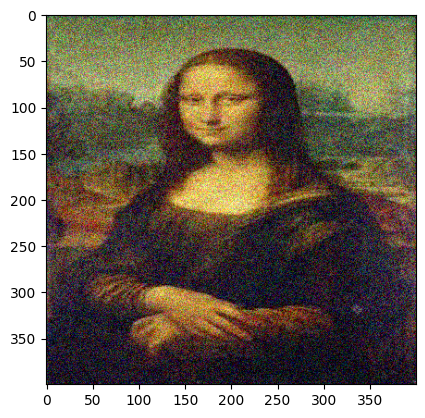

In [72]:
generated_image = tf.Variable(generated_image)

print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

[1, 400, 400, 64]
<bound method TensorShape.as_list of TensorShape([64, 160000])>
Tensor("Sum:0", shape=(), dtype=float32)
419430400000000.0
[1, 200, 200, 128]
<bound method TensorShape.as_list of TensorShape([128, 40000])>
Tensor("Sum_1:0", shape=(), dtype=float32)
104857600000000.0
[1, 100, 100, 256]
<bound method TensorShape.as_list of TensorShape([256, 10000])>
Tensor("Sum_2:0", shape=(), dtype=float32)
26214400000000.0
[1, 50, 50, 512]
<bound method TensorShape.as_list of TensorShape([512, 2500])>
Tensor("Sum_3:0", shape=(), dtype=float32)
6553600000000.0
[1, 25, 25, 512]
<bound method TensorShape.as_list of TensorShape([512, 625])>
Tensor("Sum_4:0", shape=(), dtype=float32)
409600000000.0
[1, 400, 400, 64]
<bound method TensorShape.as_list of TensorShape([64, 160000])>
Tensor("Sum:0", shape=(), dtype=float32)
419430400000000.0
[1, 200, 200, 128]
<bound method TensorShape.as_list of TensorShape([128, 40000])>
Tensor("Sum_1:0", shape=(), dtype=float32)
104857600000000.0
[1, 100, 10

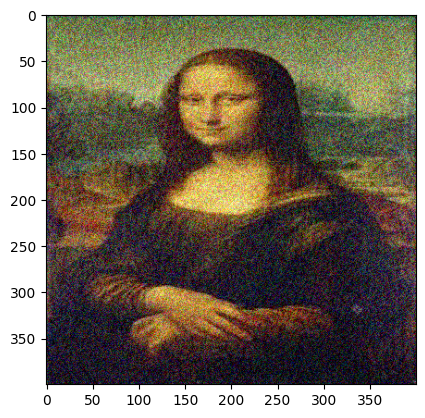

Epoch 100 


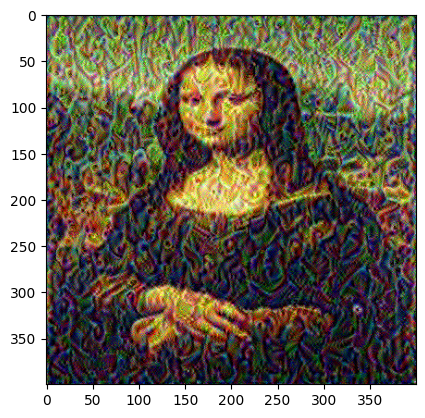

Epoch 200 


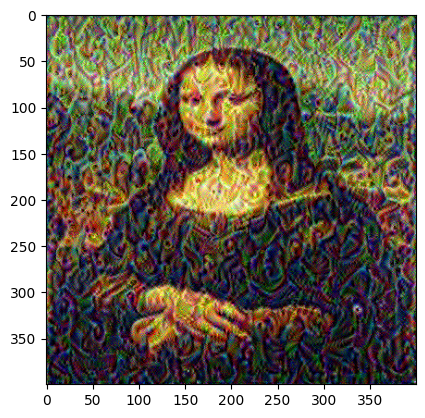

Epoch 300 


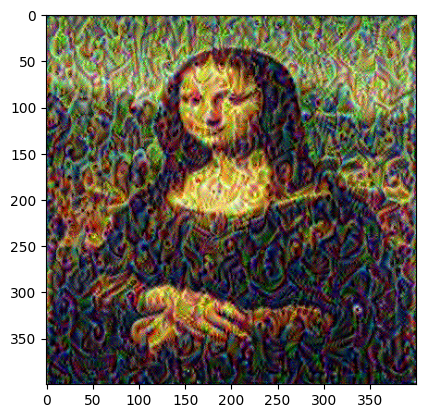

Epoch 400 


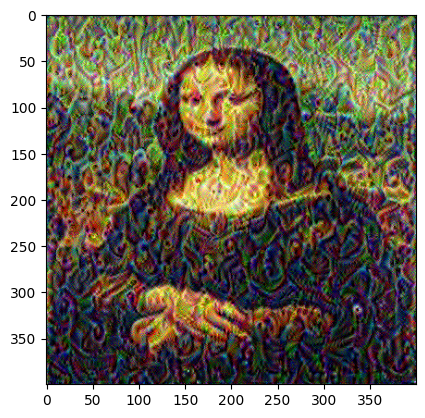

In [73]:
epochs = 500
for i in range(epochs):
    train_step(generated_image)
    if i % 100 == 0:
        print(f"Epoch {i} ")
    if i % 100 == 0:
        image = tensor_to_image(generated_image)
        imshow(image)
        #image.save(f"output/image_{i}.jpg")
        plt.show()

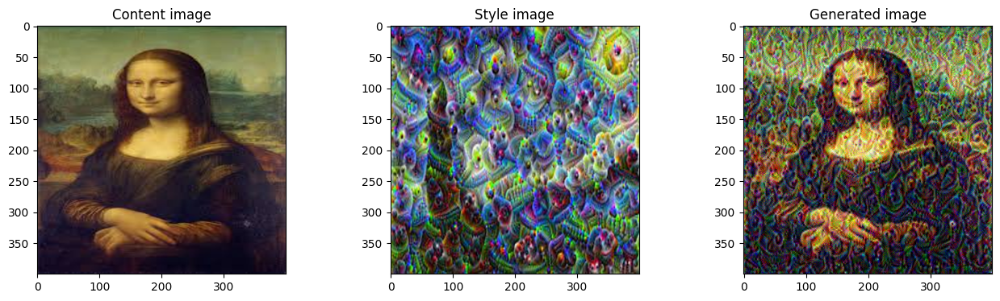

In [74]:
fig = plt.figure(figsize=(16, 4))
ax = fig.add_subplot(1, 3, 1)
imshow(content_image[0])
ax.title.set_text('Content image')
ax = fig.add_subplot(1, 3, 2)
imshow(style_image[0])
ax.title.set_text('Style image')
ax = fig.add_subplot(1, 3, 3)
imshow(generated_image[0])
ax.title.set_text('Generated image')
plt.show()

In [75]:
for layer in vgg1.layers:
    print(layer.name)

input_6
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_pool


In [76]:
STYLE_LAYERS = [
    ('block1_conv1', 0.2),
    ('block2_conv1', 0.2),
    ('block3_conv1', 0.2),
    ('block4_conv1', 0.2),
    ('block5_conv1', 0.2)]

(1, 400, 400, 3)


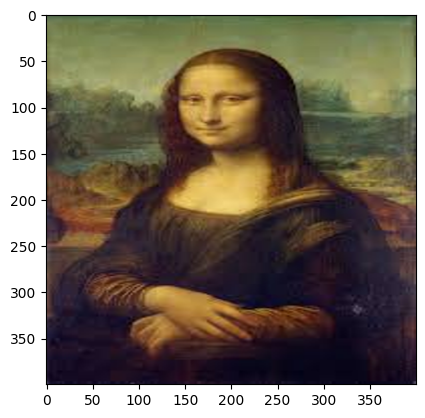

In [77]:
content_image = np.array(Image.open("/mona_lisa.jpg").resize((img_size, img_size)))
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))

print(content_image.shape)
imshow(content_image[0])
plt.show()

(1, 400, 400, 3)


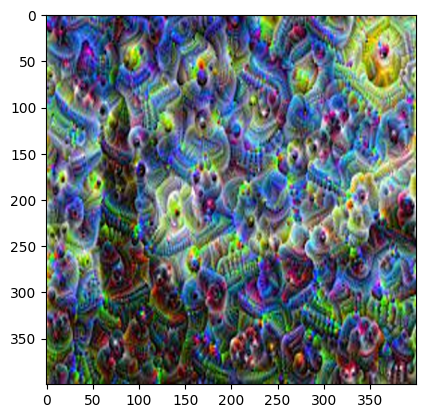

In [78]:
style_image =  np.array(Image.open("/style3.jpg").resize((img_size, img_size)))
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))

print(style_image.shape)
imshow(style_image[0])
plt.show()

(1, 400, 400, 3)


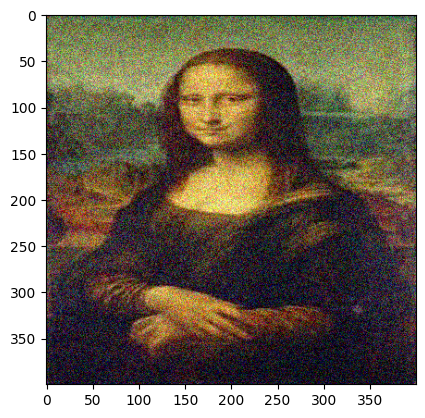

In [79]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), -0.25, 0.25)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)

print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

In [80]:
def get_layer_outputs(vgg1, layer_names):
    """ Creates a vgg model that returns a list of intermediate output values."""
    outputs = [vgg1.get_layer(layer[0]).output for layer in layer_names]

    model = tf.keras.Model([vgg1.input], outputs)
    return model

In [81]:
content_layer = [('block5_conv3', 1)]

vgg_model_outputs = get_layer_outputs(vgg1, STYLE_LAYERS + content_layer)

In [82]:
content_target = vgg_model_outputs(content_image)  # Content encoder
style_targets = vgg_model_outputs(style_image)     # Style encoder

In [83]:
preprocessed_content =  tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

In [84]:
preprocessed_style =  tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S = vgg_model_outputs(preprocessed_style)

(1, 400, 400, 3)


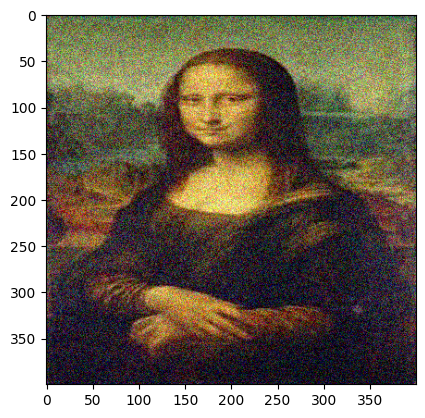

In [85]:
generated_image = tf.Variable(generated_image)

print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

Epoch 0 


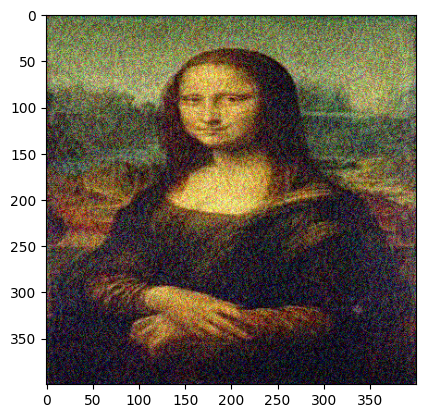

Epoch 100 


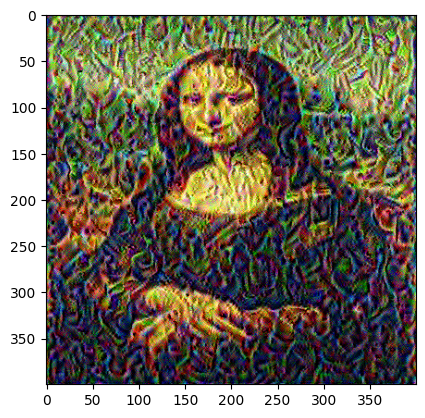

Epoch 200 


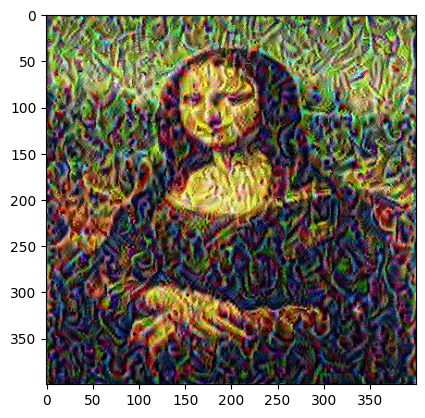

Epoch 300 


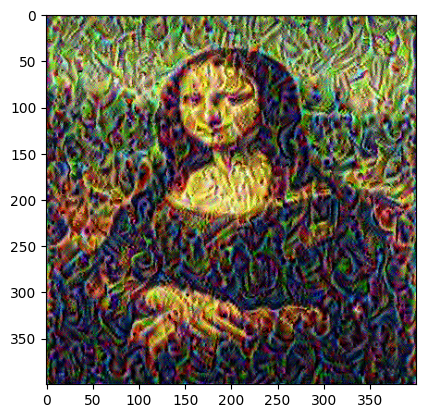

Epoch 400 


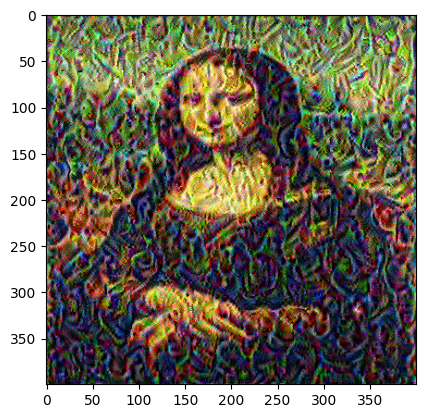

In [86]:
epochs = 500
for i in range(epochs):
    train_step(generated_image)
    if i % 100 == 0:
        print(f"Epoch {i} ")
    if i % 100 == 0:
        image = tensor_to_image(generated_image)
        imshow(image)
        #image.save(f"output/image_{i}.jpg")
        plt.show()

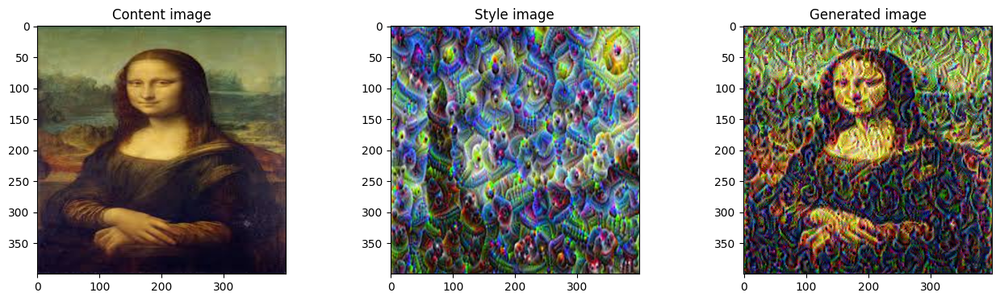

In [87]:
fig = plt.figure(figsize=(16, 4))
ax = fig.add_subplot(1, 3, 1)
imshow(content_image[0])
ax.title.set_text('Content image')
ax = fig.add_subplot(1, 3, 2)
imshow(style_image[0])
ax.title.set_text('Style image')
ax = fig.add_subplot(1, 3, 3)
imshow(generated_image[0])
ax.title.set_text('Generated image')
plt.show()